In [1]:
import os  # type:ignore # isort:skip # fmt:skip # noqa # nopep8
import sys  # type:ignore # isort:skip # fmt:skip # noqa # nopep8
from pathlib import Path  # type:ignore # isort:skip # fmt:skip # noqa # nopep8

mod = sys.modules[__name__]

code_dir = None
code_dir_name = 'Code'
unwanted_subdir_name = 'Analysis'

for _ in range(5):

    parent_path = str(Path.cwd().parents[_]).split('/')[-1]

    if (code_dir_name in parent_path) and (unwanted_subdir_name not in parent_path):

        code_dir = str(Path.cwd().parents[_])

        if code_dir is not None:
            break

sys.path.append(code_dir)
# %load_ext autoreload
# %autoreload 2


In [2]:
from setup_module.imports import * # type:ignore # isort:skip # fmt:skip # noqa # nopep8
from estimators_get_pipe import * # type:ignore # isort:skip # fmt:skip # noqa # nopep8
from setup_module import specification_curve_fork as specy # type:ignore # isort:skip # fmt:skip # noqa # nopep8


Using MPS


0it [00:00, ?it/s]

Using MPS


0it [00:00, ?it/s]

<Figure size 640x480 with 0 Axes>

### Set variables

In [3]:
# Variables
method = 'Supervised'
with open(f'{data_dir}{method}_results_save_path.txt', 'r') as f:
    results_save_path = f.read()
with open(f'{data_dir}{method}_done_xy_save_path.txt', 'r') as f:
    done_xy_save_path = f.read()
t = time.time()
n_jobs = -1
n_splits = 10
n_repeats = 3
random_state = 42
refit = True
class_weight = 'balanced'
cv = RepeatedStratifiedKFold(
    n_splits=n_splits, n_repeats=n_repeats, random_state=random_state
)
scoring = 'recall'
scores = [
    'recall', 'accuracy', 'f1', 'roc_auc',
    'explained_variance', 'matthews_corrcoef'
]
scorers = {
    'precision_score': make_scorer(precision_score, zero_division=0),
    'recall_score': make_scorer(recall_score, zero_division=0),
    'accuracy_score': make_scorer(accuracy_score, zero_division=0),
}
analysis_columns = ['Warmth', 'Competence']
text_col = 'Job Description spacy_sentencized'
metrics_dict = {
    f'{scoring.title()} Best Score': np.nan,
    f'{scoring.title()} Best Threshold': np.nan,
    'Train - Mean Cross Validation Score': np.nan,
    f'Train - Mean Cross Validation - {scoring.title()}': np.nan,
    f'Train - Mean Explained Variance - {scoring.title()}': np.nan,
    'Test - Mean Cross Validation Score': np.nan,
    f'Test - Mean Cross Validation - {scoring.title()}': np.nan,
    f'Test - Mean Explained Variance - {scoring.title()}': np.nan,
    'Explained Variance': np.nan,
    'Accuracy': np.nan,
    'Balanced Accuracy': np.nan,
    'Precision': np.nan,
    'Average Precision': np.nan,
    'Recall': np.nan,
    'F1-score': np.nan,
    'Matthews Correlation Coefficient': np.nan,
    'Fowlkes–Mallows Index': np.nan,
    'R2 Score': np.nan,
    'ROC': np.nan,
    'AUC': np.nan,
    'Log Loss/Cross Entropy': np.nan,
    'Cohen’s Kappa': np.nan,
    'Geometric Mean': np.nan,
    'Classification Report': np.nan,
    'Imbalanced Classification Report': np.nan,
    'Confusion Matrix': np.nan,
    'Normalized Confusion Matrix': np.nan,
}

# Transformer variables
max_length = 512
returned_tensor = 'pt'
cpu_counts = torch.multiprocessing.cpu_count()
device = torch.device('mps') if torch.has_mps and torch.backends.mps.is_built() and torch.backends.mps.is_available(
) else torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
device_name = str(device.type)
print(f'Using {device_name.upper()}')
# Set random seed
random_state = 42
random.seed(random_state)
np.random.seed(random_state)
torch.manual_seed(random_state)
cores = multiprocessing.cpu_count()
torch.Generator(device_name).manual_seed(random_state)
cores = multiprocessing.cpu_count()
accelerator = Accelerator()
torch.autograd.set_detect_anomaly(True)
os.environ.get('TOKENIZERS_PARALLELISM')
best_trial_args = [
    'num_train_epochs', 'learning_rate',
]
training_args_dict = {
    'seed': random_state,
    'resume_from_checkpoint': True,
    'overwrite_output_dir': True,
    'logging_steps': 500,
    'evaluation_strategy': 'steps',
    'eval_steps': 500,
    'save_strategy': 'steps',
    'save_steps': 500,
    # 'metric_for_best_model': 'recall',
    # 'torch_compile': bool(transformers.file_utils.is_torch_available()),
    'use_mps_device': bool(device_name == 'mps' and torch.backends.mps.is_available()),
    'optim': 'adamw_torch',
    'load_best_model_at_end': True,
    'per_device_train_batch_size': 16,
    'per_device_eval_batch_size': 20,
    'warmup_steps': 100,
    'weight_decay': 0.01,
    # The below metrics are used by hyperparameter search
    'num_train_epochs': 3,
    'learning_rate': 5e-5,
}
training_args_dict_for_best_trial = {
    arg_name: arg_
    for arg_name, arg_ in training_args_dict.items()
    if arg_name not in best_trial_args
}

# Plotting variables
pp = pprint.PrettyPrinter(indent=4)
tqdm.tqdm.pandas(desc='progress-bar')
tqdm_auto.tqdm.pandas(desc='progress-bar')
# tqdm.notebook.tqdm().pandas(desc='progress-bar')
tqdm_auto.notebook_tqdm().pandas(desc='progress-bar')
# pbar = progressbar.ProgressBar(maxval=10)
mpl.style.use(f'{code_dir}/setup_module/apa.mplstyle-main/apa.mplstyle')
mpl.rcParams['text.usetex'] = False
font = {'family': 'arial', 'weight': 'normal', 'size': 10}
mpl.rc('font', **font)
plt.style.use('tableau-colorblind10')
plt.set_cmap('Blues')
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 5000)
pd.set_option('display.colheader_justify', 'center')
pd.set_option('display.precision', 3)
pd.set_option('display.float_format', '{:.2f}'.format)


Using MPS


0it [00:00, ?it/s]

<Figure size 640x480 with 0 Axes>

# Functions


In [4]:
class ToDataset(torch.utils.data.Dataset):
    def __init__(self, encodings):
        self.encodings = encodings

    def __getitem__(self, idx):
        return {
            key: val[idx].clone().detach().to(device)
            for key, val in self.encodings.items()
        }

    def __len__(self):
        return len(self.encodings['input_ids'])


In [5]:
class ImbTrainer(Trainer):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.class_weights = self._calculate_class_weights(self.train_dataset)

    def _calculate_class_weights(self, dataset):
        # Count the number of samples in each class
        class_counts = torch.zeros(self.model.config.num_labels)
        for label in dataset.labels:
            class_counts[label] += 1

        # Calculate the inverse frequency of each class
        inv_frequencies = 1 / class_counts

        # Normalize the inverse frequencies so that they sum up to 1
        sum_inv_frequencies = torch.sum(inv_frequencies)
        return inv_frequencies / sum_inv_frequencies

    def compute_loss(self, model, inputs, return_outputs=False):
        labels = inputs.pop("labels")
        outputs = model(**inputs)
        loss_fct = nn.CrossEntropyLoss(weight=self.class_weights.to(device))
        loss = loss_fct(outputs.logits, labels)
        return (loss, outputs) if return_outputs else loss


In [6]:
# Function to get y_pred and y_pred_prob
def preprocess_logits_for_metrics_from_logits(y_pred_logits):

    # Get y_pred
    print('-'*20)
    y_pred_logits_tensor = torch.tensor(y_pred_logits, device=device)
    print('Getting y_pred through argmax of y_pred_logits...')
    try:
        y_pred_array = torch.argmax(y_pred_logits_tensor, axis=-1).cpu().numpy()
        print('Using torch.argmax.')
    except Exception:
        y_pred_array = y_pred_logits.argmax(axis=-1)
        print('Using np.argmax.')
    print(f'y_pred_array shape: {y_pred_array.shape}')
    print('-'*20)
    print('Flattening y_pred...')
    y_pred = y_pred_array.flatten().tolist()
    print(f'y_pred length: {len(y_pred)}')
    print('-'*20)

    # Get y_pred_prob
    print('-'*20)
    print('Getting y_pred_prob through softmax of y_pred_logits...')
    try:
        y_pred_prob_array = torch.nn.functional.softmax(y_pred_logits_tensor, dim=-1).cpu().numpy()
        print('Using torch.nn.functional.softmax.')
    except Exception:
        y_pred_prob_array = scipy.special.softmax(y_pred_logits, axis=-1)
        print('Using scipy.special.softmax.')
    # from: https://discuss.huggingface.co/t/different-results-predicting-from-trainer-and-model/12922
    assert all(y_pred_prob_array.argmax(axis=-1) == y_pred_array), 'Argmax of y_pred_prob_array does not match y_pred_array.'
    print(f'y_pred_prob shape: {y_pred_prob_array.shape}')
    print('-'*20)
    print('Flattening y_pred_prob and extracting probabilities of 1...')
    y_pred_prob = y_pred_prob_array[:, -1].flatten().tolist()
    print(f'y_pred length: {len(y_pred_prob)}')
    print('-'*20)

    y_pred_logits_tensor.clone().detach()

    return (
        y_pred_array, y_pred, y_pred_prob_array, y_pred_prob
    )


# Classifying

### READ DATA

In [7]:
with open(f'{data_dir}df_jobs_len.txt', 'r') as f:
    df_jobs_len = int(f.read())

df_jobs = pd.read_pickle(f'{df_save_dir}df_jobs_for_classification.pkl')
assert len(df_jobs) == df_jobs_len, f'DATAFRAME MISSING DATA! DF SHOULD BE OF LENGTH {df_jobs_len} BUT IS OF LENGTH {len(df_jobs)}'
print(f'Dataframe loaded with shape: {df_jobs.shape}')


Dataframe loaded with shape: (307300, 75)


In [8]:
%%time
print('#'*40)
print('Starting!')
print('#'*40)

protocol = pickle.HIGHEST_PROTOCOL
analysis_columns = ['Warmth', 'Competence']
text_col = 'Job Description spacy_sentencized'
classified_columns = ['Warmth_Probability', 'Competence_Probability']
final_estimators_dict = {
    'Warmth': {
        'vectorizer_name': 'BERTBASEUNCASED',
        'classifier_name': 'BertForSequenceClassification',
    },
    'Competence': {
        'vectorizer_name': 'BERTBASEUNCASED',
        'classifier_name': 'BertForSequenceClassification',
    },
}

for col in tqdm.tqdm(analysis_columns):
    if col not in df_jobs.columns:
        print('-'*20)
        final_estimators_dict[col]['path_suffix'] = path_suffix = f' - {col} - {(vectorizer_name := final_estimators_dict[col]["vectorizer_name"])} + {(classifier_name := final_estimators_dict[col]["classifier_name"])} (Save_protocol={protocol})'

        if classifier_name in list(classifiers_pipe.keys()):
            method = 'Supervised'
            with open(f'{data_dir}{method}_results_save_path.txt', 'r') as f:
                results_save_path = f.read()
            print('-'*20)
            print(f'Using {classifier_name} from {method} pipeline.')
            print('Loading Supervised Estimator.')
            with open(
                f'{results_save_path}{method} Fitted Estimator {path_suffix}.pkl', 'rb'
            ) as f:
                estimator = joblib.load(f)
            print('Done loading Supervised Estimator!')

            print('-'*20)
            print('Classifying data.')
            X = np.array(list(df_jobs[text_col].astype('str').values))
            df_jobs[col] = estimator.predict(X)
            if hasattr(estimator, 'predict_proba'):
                # Get the the whole of the last column, which is the  probability of 1, and flatten to list
                df_jobs[f'{col}_Probability'] = estimator.predict_proba(X)[:, -1]

            print(f'Done classifying data using {classifier_name} for {col}!')
            print('-'*20)

        elif classifier_name in list(transformers_pipe.keys()):
            method = 'Transformers'
            with open(f'{data_dir}{method}_results_save_path.txt', 'r') as f:
                results_save_path = f.read()
            print('-'*20)
            print(f'Using {classifier_name} from {method} pipeline.')
            model = transformers_pipe[classifier_name]['model']
            tokenizer = transformers_pipe[classifier_name]['tokenizer']
            config = transformers_pipe[classifier_name]['config']

            print(f'Loading Fitted Transformer {classifier_name} from pretrained.')
            estimator_dir = f'{results_save_path}{method} Fitted Estimator{path_suffix}.model'
            output_dir = training_args_dict['output_dir'] = training_args_dict_for_best_trial['output_dir'] = final_estimators_dict[col]['output_dir'] = f'{results_save_path}{method} Final Estimator{path_suffix}.model'
            fitted_estimator = model.from_pretrained(estimator_dir)
            tokenizer = tokenizer.from_pretrained(estimator_dir)
            config = config.from_pretrained(f'{estimator_dir}/config.json')
            print(f'Done loading Fitted Transformer {classifier_name} from pretrained!')

            # Tokenize
            X = df_jobs[text_col].astype('str').values.tolist()
            encodings = tokenizer(
            X, truncation=True, padding=True, max_length=max_length, return_tensors=returned_tensor
            ).to(device)
            dataset = ToDataset(encodings)
            # Accelerate model
            (
                fitted_estimator, tokenizer, dataset
            ) = accelerator.prepare(
                fitted_estimator, tokenizer, dataset
            )

            # Get predictions
            print(f'Getting estimator for {col}.')
            estimator = Trainer(
                model=fitted_estimator,
                tokenizer=tokenizer,
                args=TrainingArguments(**training_args_dict),
                # preprocess_logits_for_metrics=preprocess_logits_for_metrics_y_pred_prob,
                # callbacks=[EarlyStoppingCallback(early_stopping_patience=3)],
                # data_collator=transformers.DataCollatorWithPadding(tokenizer),
            )
            if estimator.place_model_on_device:
                estimator.model.to(device)

            print('-'*20)
            print(f'Classifying data using {classifier_name} for {col}.')
            (y_pred_logits, y_labels, metrics) = estimator.predict(dataset)
            y_pred_array, y_pred, y_pred_prob_array, y_pred_prob = preprocess_logits_for_metrics_from_logits(y_pred_logits)
            df_jobs[col] = y_pred
            df_jobs[f'{col}_Probability'] = y_pred_prob

            print(f'Done classifying data using {classifier_name} for {col}!')
            print('-'*20)

            assert len(df_jobs) > 0 and isinstance(df_jobs, pd.DataFrame), f'ERORR: LENGTH OF DF = {len(df_jobs)}'
            df_jobs.to_pickle(f'{df_save_dir}df_jobs_for_analysis.pkl')
            df_jobs.to_csv(f'{df_save_dir}df_jobs_for_analysis.csv', index=False)
            print(f'Dataframe saved to {df_save_dir}df_jobs_for_analysis.pkl')
            print('-'*20)
    else:
        print(f'Column {col} already exists in dataframe. Skipping.')


########################################
Starting!
########################################


  0%|          | 0/2 [00:00<?, ?it/s]

--------------------
--------------------
Using BertForSequenceClassification from Transformers pipeline.
Loading Transformer Estimator.


You're using a BertTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


Done loading Transformer Estimator!
Getting prediction results for Warmth.
--------------------
Classifying data.


  0%|          | 0/15365 [00:00<?, ?it/s]

--------------------
Getting y_pred through argmax of y_pred_logits...
Using torch.argmax.
y_pred_array shape: (307300,)
--------------------
Flattening y_pred...
y_pred length: 307300
--------------------
--------------------
Getting y_pred_prob through softmax of y_pred_logits...
Using torch.nn.functional.softmax.
y_pred_prob shape: (307300, 2)
--------------------
Flattening y_pred_prob and extracting probabilities of 1...
y_pred length: 307300
--------------------
Done classifying data using BertForSequenceClassification for Warmth!
--------------------


 50%|█████     | 1/2 [7:08:15<7:08:15, 25695.83s/it]

--------------------
--------------------
Using BertForSequenceClassification from Transformers pipeline.
Loading Transformer Estimator.
Done loading Transformer Estimator!
Getting prediction results for Competence.


You're using a BertTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


--------------------
Classifying data.


  0%|          | 0/15365 [00:00<?, ?it/s]

--------------------
Getting y_pred through argmax of y_pred_logits...
Using torch.argmax.
y_pred_array shape: (307300,)
--------------------
Flattening y_pred...
y_pred length: 307300
--------------------
--------------------
Getting y_pred_prob through softmax of y_pred_logits...
Using torch.nn.functional.softmax.
y_pred_prob shape: (307300, 2)
--------------------
Flattening y_pred_prob and extracting probabilities of 1...
y_pred length: 307300
--------------------
Done classifying data using BertForSequenceClassification for Competence!
--------------------


100%|██████████| 2/2 [14:02:29<00:00, 25274.53s/it] 

CPU times: user 1h 11min 18s, sys: 48min 2s, total: 1h 59min 21s
Wall time: 14h 2min 29s


## Inspect classified data

In [30]:
df_jobs = df_jobs.dropna(subset=['Warmth', 'Warmth_Probability', 'Competence', 'Competence_Probability'])


In [31]:
assert len(df_jobs) > 0 and isinstance(df_jobs, pd.DataFrame), f'ERORR: LENGTH OF DF = {len(df_jobs)}'
df_jobs.to_pickle(f'{df_save_dir}df_jobs_for_analysis.pkl')
df_jobs.to_csv(f'{df_save_dir}df_jobs_for_analysis.csv', index=False)


In [32]:
df_jobs.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 307300 entries, 0 to 408598
Data columns (total 79 columns):
 #   Column                                            Non-Null Count   Dtype   
---  ------                                            --------------   -----   
 0   Search Keyword                                    307300 non-null  object  
 1   Platform                                          307300 non-null  object  
 2   Job ID                                            307300 non-null  object  
 3   Job Title                                         307300 non-null  object  
 4   Company Name                                      307290 non-null  object  
 5   Location                                          307300 non-null  object  
 6   Job Description                                   307300 non-null  object  
 7   Rating                                            165831 non-null  float64 
 8   Employment Type                                   281198 non-null  object 

In [33]:
df_jobs.describe()


,Rating,Data Row,Dutch Requirement in Job Ad_No,Dutch Requirement in Job Ad_Yes,English Requirement in Job Ad_No,English Requirement in Job Ad_Yes,Keywords Count,Gender_Female_n,Gender_Female_% per Sector,Gender_Female_% per Social Category,Gender_Female_% per Workforce,Gender_Male_n,Gender_Male_% per Sector,Gender_Male_% per Social Category,Gender_Male_% per Workforce,Age_Older_n,Age_Older_% per Sector,Age_Older_% per Social Category,Age_Older_% per Workforce,Age_Younger_n,Age_Younger_% per Sector,Age_Younger_% per Social Category,Age_Younger_% per Workforce,Sector_n,% Sector per Workforce,Gender_Female,Gender_Male,Gender_Mixed,Age_Mixed,Age_Older,Age_Younger,Gender_Num,Age_Num,Platform_Num,Platform_LinkedIn,Platform_Indeed,Platform_Glassdoor,Job Description num_words,Job Description num_unique_words,Job Description num_chars,Job Description num_chars_no_whitespact_and_punt,Job Description num_punctuations,Warmth,Warmth_Probability,Competence,Competence_Probability
count,165831.00,141328.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00,307300.00
mean,-0.38,359.43,0.97,0.03,0.94,0.06,6.81,656.72,45.36,5.46,2.60,712.09,54.60,5.37,2.82,528.38,40.86,4.97,2.09,840.02,59.04,5.74,3.32,1369.06,5.42,0.25,0.37,0.38,0.64,0.20,0.15,1.11,0.95,0.62,0.46,0.45,0.08,17.67,15.81,114.12,95.87,0.31,0.31,0.31,0.52,0.47
std,1.63,284.65,0.17,0.17,0.23,0.23,2.88,1047.61,19.49,8.72,4.15,1235.25,19.52,9.32,4.89,796.62,10.12,7.49,3.15,1437.63,9.98,9.83,5.69,2215.89,8.77,0.44,0.48,0.49,0.48,0.40,0.36,0.78,0.60,0.64,0.50,0.50,0.28,16.45,12.77,107.75,90.37,0.53,0.46,0.38,0.50,0.35
min,-1.00,1.00,0.00,0.00,0.00,0.00,1.00,7.00,12.50,0.06,0.03,21.00,15.63,0.16,0.08,15.00,18.94,0.14,0.06,13.00,44.44,0.09,0.05,29.00,0.11,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,2.00,6.00,1.00,0.00,0.00,0.00,0.00,0.00
25%,-1.00,111.00,1.00,0.00,1.00,0.00,4.00,87.00,27.59,0.72,0.34,189.00,34.87,1.43,0.75,95.00,32.76,0.89,0.38,195.00,51.18,1.33,0.77,290.00,1.15,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,7.00,7.00,45.00,38.00,0.00,0.00,0.02,0.00,0.07
50%,-1.00,291.00,1.00,0.00,1.00,0.00,7.00,226.00,43.13,1.88,0.89,210.00,56.87,1.58,0.83,205.00,41.67,1.93,0.81,288.00,56.82,1.97,1.14,398.00,1.57,0.00,0.00,0.00,1.00,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,13.00,12.00,84.00,70.00,0.00,0.00,0.07,1.00,0.54
75%,-1.00,578.00,1.00,0.00,1.00,0.00,9.00,416.00,65.13,3.46,1.65,557.00,72.41,4.20,2.20,661.00,48.82,6.22,2.62,708.00,67.24,4.84,2.80,1399.00,5.54,1.00,1.00,1.00,1.00,0.00,0.00,2.00,1.00,1.00,1.00,1.00,0.00,22.00,20.00,144.00,121.00,1.00,1.00,0.77,1.00,0.82
max,5.00,1000.00,1.00,1.00,1.00,1.00,11.00,3970.00,84.30,33.04,15.71,4510.00,87.50,34.04,17.85,2844.00,58.33,26.75,11.25,5228.00,80.81,35.73,20.69,7931.00,31.39,1.00,1.00,1.00,1.00,1.00,1.00,2.00,2.00,2.00,1.00,1.00,1.00,349.00,209.00,2496.00,2142.00,11.00,1.00,0.96,1.00,0.94


In [34]:
df_jobs[['Warmth', 'Warmth_Probability', 'Competence', 'Competence_Probability']].head()

,Warmth,Warmth_Probability,Competence,Competence_Probability
0,0,0.02,0,0.01
1,0,0.01,0,0.10
2,1,0.75,1,0.56
3,0,0.07,1,0.88
4,1,0.89,0,0.08


In [35]:
df_jobs[['Warmth', 'Warmth_Probability', 'Competence', 'Competence_Probability']].describe()

,Warmth,Warmth_Probability,Competence,Competence_Probability
count,307300.00,307300.00,307300.00,307300.00
mean,0.31,0.31,0.52,0.47
std,0.46,0.38,0.50,0.35
min,0.00,0.00,0.00,0.00
25%,0.00,0.02,0.00,0.07
50%,0.00,0.07,1.00,0.54
75%,1.00,0.77,1.00,0.82
max,1.00,0.96,1.00,0.94


In [36]:
get_df_info(df_jobs, ivs_all=analysis_columns)



DF INFO:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307300 entries, 0 to 408598
Data columns (total 79 columns):
 #   Column                                            Non-Null Count   Dtype   
---  ------                                            --------------   -----   
 0   Search Keyword                                    307300 non-null  object  
 1   Platform                                          307300 non-null  object  
 2   Job ID                                            307300 non-null  object  
 3   Job Title                                         307300 non-null  object  
 4   Company Name                                      307290 non-null  object  
 5   Location                                          307300 non-null  object  
 6   Job Description                                   307300 non-null  object  
 7   Rating                                            165831 non-null  float64 
 8   Employment Type                                   281198 non-nu

In [37]:
get_df_info(df_jobs, ivs_all=classified_columns)



DF INFO:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307300 entries, 0 to 408598
Data columns (total 79 columns):
 #   Column                                            Non-Null Count   Dtype   
---  ------                                            --------------   -----   
 0   Search Keyword                                    307300 non-null  object  
 1   Platform                                          307300 non-null  object  
 2   Job ID                                            307300 non-null  object  
 3   Job Title                                         307300 non-null  object  
 4   Company Name                                      307290 non-null  object  
 5   Location                                          307300 non-null  object  
 6   Job Description                                   307300 non-null  object  
 7   Rating                                            165831 non-null  float64 
 8   Employment Type                                   281198 non-nu

In [38]:
get_df_info(df_jobs, ivs_all=dvs_all)



DF INFO:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307300 entries, 0 to 408598
Data columns (total 79 columns):
 #   Column                                            Non-Null Count   Dtype   
---  ------                                            --------------   -----   
 0   Search Keyword                                    307300 non-null  object  
 1   Platform                                          307300 non-null  object  
 2   Job ID                                            307300 non-null  object  
 3   Job Title                                         307300 non-null  object  
 4   Company Name                                      307290 non-null  object  
 5   Location                                          307300 non-null  object  
 6   Job Description                                   307300 non-null  object  
 7   Rating                                            165831 non-null  float64 
 8   Employment Type                                   281198 non-nu

### Plot classified data


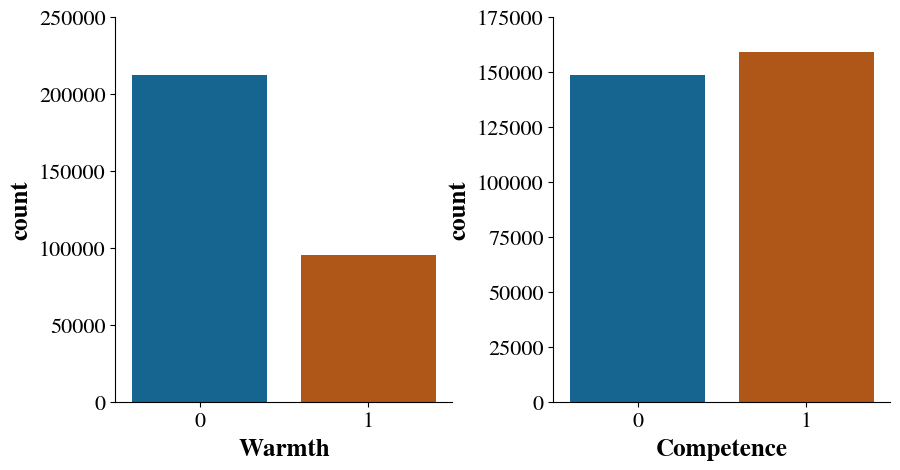

In [39]:
# Counts plot of classifed warmthh and competence
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.countplot(x='Warmth', data=df_jobs, ax=ax[0], palette=['C0', 'C5'])
sns.countplot(x='Competence', data=df_jobs, ax=ax[1], palette=['C0', 'C5'])
plt.show()


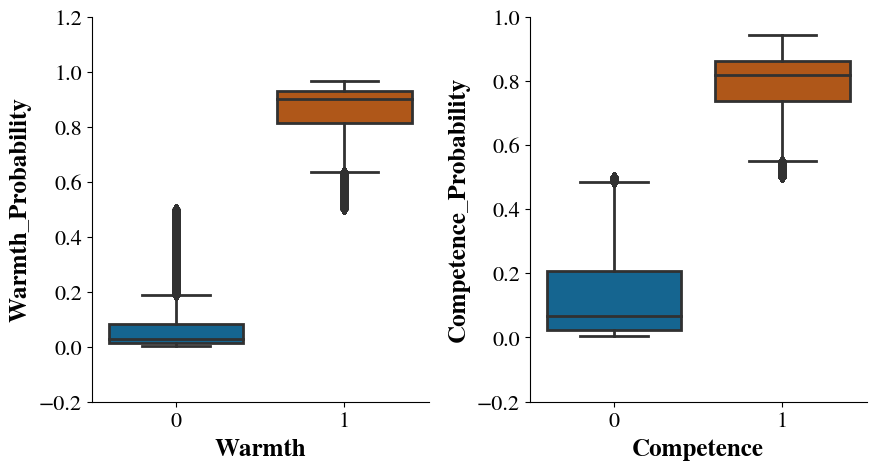

In [40]:
# Box plot of warmth and competence probabilities
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.boxplot(x='Warmth', y='Warmth_Probability', data=df_jobs, ax=ax[0], palette=['C0', 'C5'])
sns.boxplot(x='Competence', y='Competence_Probability', data=df_jobs, ax=ax[1], palette=['C0', 'C5'])
plt.show()


Running Logit specification curve analysis with:
DEPENDENT VARIABLES = ['Warmth', 'Competence']
INDEPENDENT VARIABLES = ['Gender_Female', 'Gender_Mixed', 'Gender_Male', 'Gender_Female_% per Sector', 'Gender_Male_% per Sector', 'Age_Older', 'Age_Mixed', 'Age_Younger', 'Age_Older_% per Sector', 'Age_Younger_% per Sector']
CONTROLS = ['% Sector per Workforce', 'Job Description num_words', 'English Requirement in Sentence', 'Dutch Requirement in Sentence']
         Current function value: 0.619231
         Iterations: 35
Optimization terminated successfully.
         Current function value: 0.619227
         Iterations 7


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566947
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.619231
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.619231
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566941
         Iterations: 35
Optimization terminated successfully.
         Current function value: 0.619227
         Iterations 7


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.619227
         Iterations 7
         Current function value: 0.566947
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566947
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.619231
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566941
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566941
         Iterations: 35
Optimization terminated successfully.
         Current function value: 0.619227
         Iterations 7


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566947
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566941
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.618342
         Iterations 10
         Current function value: 0.618265
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.566577
         Iterations 33
Optimization terminated successfully.
         Current function value: 0.618342
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.618342
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.566534
         Iterations 5
         Current function value: 0.618265
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.618265
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.566577
         Iterations 33
Optimization terminated successfully.
         Current function value: 0.566577
         Iterations 33
Optimization terminated successfully.
         Current function value: 0.618342
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.566534
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566534
         Iterations 5
         Current function value: 0.618265
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.566577
         Iterations 33
Optimization terminated successfully.
         Current function value: 0.566534
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618197
         Iterations 9
         Current function value: 0.618130
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.565822
         Iterations 32
Optimization terminated successfully.
         Current function value: 0.618197
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.618197
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.565733
         Iterations 10
         Current function value: 0.618130
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.618130
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.565822
         Iterations 32
Optimization terminated successfully.
         Current function value: 0.565822
         Iterations 32
Optimization terminated successfully.
         Current function value: 0.618197
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.565733
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.565733
         Iterations 10
         Current function value: 0.618130
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.565822
         Iterations 32
Optimization terminated successfully.
         Current function value: 0.565733
         Iterations 10
         Current function value: 0.618938
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.618935
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566650
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.618938
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.618938
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566643
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.618935
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.618935
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566650
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566650
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.618938
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566643
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566643
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.618935
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566650
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566643
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.619235
         Iterations 22
Optimization terminated successfully.
         Current function value: 0.619232
         Iterations 7
         Current function value: 0.567090
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.619235
         Iterations 22
Optimization terminated successfully.
         Current function value: 0.619235
         Iterations 22
         Current function value: 0.567090
         Iterations: 35
Optimization terminated successfully.
         Current function value: 0.619232
         Iterations 7


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.619232
         Iterations 7
         Current function value: 0.567090
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.567090
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.619235
         Iterations 22
         Current function value: 0.567090
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.567090
         Iterations: 35
Optimization terminated successfully.
         Current function value: 0.619232
         Iterations 7


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.567090
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.567090
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.618883
         Iterations: 35
Optimization terminated successfully.
         Current function value: 0.618865
         Iterations 6


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566878
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.618883
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.618883
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566864
         Iterations: 35
Optimization terminated successfully.
         Current function value: 0.618865
         Iterations 6


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.618865
         Iterations 6
         Current function value: 0.566878
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566878
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.618883
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566864
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566864
         Iterations: 35
Optimization terminated successfully.
         Current function value: 0.618865
         Iterations 6


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566878
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.566864
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691785
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691708
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630344
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691785
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691785
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630254
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691708
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691708
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630344
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630344
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691785
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630254
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630254
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691708
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630344
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630254
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.692533
         Iterations: 35
Optimization terminated successfully.
         Current function value: 0.692427
         Iterations 3


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630583
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.692533
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.692533
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630396
         Iterations: 35
Optimization terminated successfully.
         Current function value: 0.692427
         Iterations 3


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.692427
         Iterations 3
         Current function value: 0.630583
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630583
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.692533
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630396
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630396
         Iterations: 35
Optimization terminated successfully.
         Current function value: 0.692427
         Iterations 3


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630583
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630396
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691963
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691640
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.630076
         Iterations 10
         Current function value: 0.691963
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691963
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.629743
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691640
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691640
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.630076
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.630076
         Iterations 10
         Current function value: 0.691963
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.629743
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.629743
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691640
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.630076
         Iterations 10
         Current function value: 0.629743
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691954
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691735
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630178
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691954
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691954
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.629965
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691735
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691735
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630178
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630178
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691954
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.629965
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.629965
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.691735
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630178
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.629965
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.692425
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.692255
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.630624
         Iterations 28
         Current function value: 0.692425
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.692425
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630486
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.692255
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.692255
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.630624
         Iterations 28
Optimization terminated successfully.
         Current function value: 0.630624
         Iterations 28
         Current function value: 0.692425
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630486
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630486
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.692255
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.630624
         Iterations 28
         Current function value: 0.630486
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.692363
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.692293
         Iterations 9
         Current function value: 0.630327
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.692363
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.692363
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630263
         Iterations: 35
Optimization terminated successfully.
         Current function value: 0.692293
         Iterations 9


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.692293
         Iterations 9
         Current function value: 0.630327
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630327
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.692363
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630263
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630263
         Iterations: 35
Optimization terminated successfully.
         Current function value: 0.692293
         Iterations 9


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630327
         Iterations: 35


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.630263
         Iterations: 35
Fit complete


/opt/homebrew/Caskroom/mambaforge/base/envs/study1_3.10/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


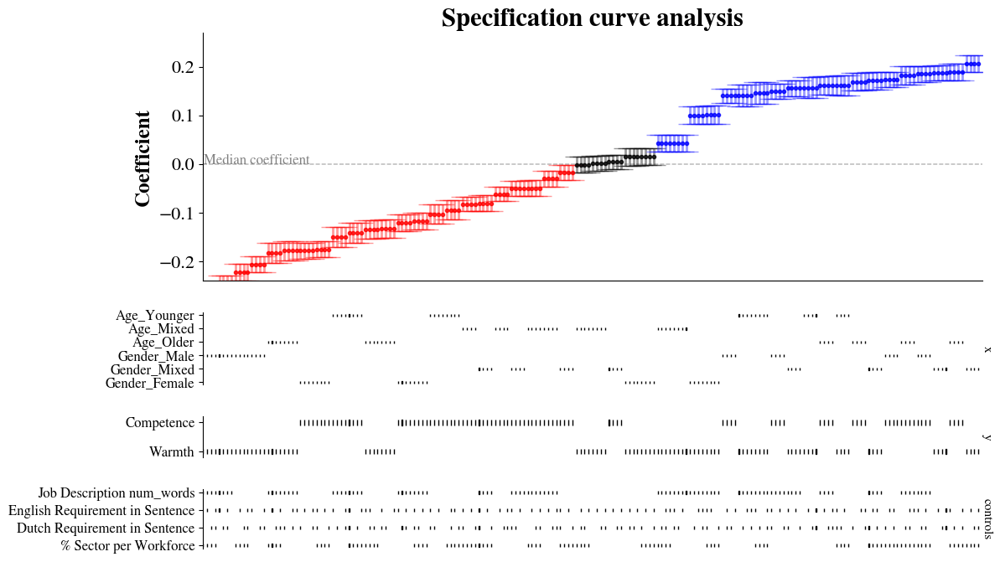

In [41]:
# Specification curve analysis
print(f'Running Logit specification curve analysis with:\nDEPENDENT VARIABLES = {dvs}\nINDEPENDENT VARIABLES = {ivs_dummy_and_perc}\nCONTROLS = {controls}')
sc = specy.SpecificationCurve(df=df_jobs, y_endog=dvs, x_exog=ivs_dummy, controls=controls)
sc.fit(estimator=sm.Logit)
sc.plot(show_plot=True)


Running OLS specification curve analysis with:
DEPENDENT VARIABLES = ['Warmth_Probability', 'Competence_Probability']
INDEPENDENT VARIABLES = ['Gender_Female', 'Gender_Mixed', 'Gender_Male', 'Gender_Female_% per Sector', 'Gender_Male_% per Sector', 'Age_Older', 'Age_Mixed', 'Age_Younger', 'Age_Older_% per Sector', 'Age_Younger_% per Sector']
CONTROLS = ['% Sector per Workforce', 'Job Description num_words', 'English Requirement in Sentence', 'Dutch Requirement in Sentence']
Fit complete


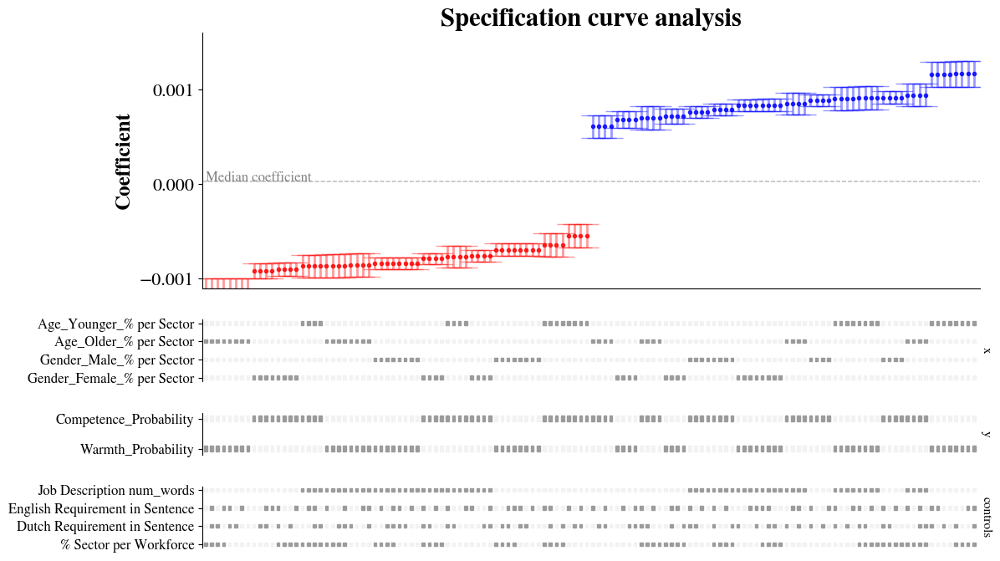

In [42]:
# Specification curve analysis
print(f'Running OLS specification curve analysis with:\nDEPENDENT VARIABLES = {dvs_prob}\nINDEPENDENT VARIABLES = {ivs_dummy_and_perc}\nCONTROLS = {controls}')
sc = specy.SpecificationCurve(df=df_jobs, y_endog=dvs_prob, x_exog=ivs_perc, controls=controls)
sc.fit(estimator=sm.OLS)
sc.plot(show_plot=True)

### Save dataframe


In [43]:
assert len(df_jobs) > 0 and isinstance(df_jobs, pd.DataFrame), f'ERORR: LENGTH OF DF = {len(df_jobs)}'
df_jobs.to_pickle(f'{df_save_dir}df_jobs_for_analysis.pkl')
df_jobs.to_csv(f'{df_save_dir}df_jobs_for_analysis.csv', index=False)
